In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm
from numpy.linalg import norm

from External.ICT.calculate_ICT import calculate_ICT, compute_widths
from External.clustering import k_means_pp, centers
from External.generation import create_graph
from External.plotting import plot_points, plot_graph, no_intersections
from External.data_loader import data_loader
from External.ICT.reduce_to_mst import MST



plt.style.use('standard.mplstyle')

cv2 package not present. No movies possible


In [5]:
def patch_together_nearest(G, position):
    list_of_all_nodes = np.array(range(G.numberOfNodes()))
    
    cc = nk.components.ConnectedComponents(G)
    cc.run()
    components = cc.getComponents()
    number_of_components = cc.numberOfComponents()
    
    bridges = 1
    
    while number_of_components != 1:

            

        compA = np.array(components[0])
        compB = np.delete(list_of_all_nodes, compA)


        pointsA = position[compA]
        pointsB = position[compB]
        
        diff = pairwise_distances(pointsA, pointsB, n_jobs=-1)

        top_bridges = np.argpartition(diff.flatten(), bridges)[0:bridges]
        indices = np.unravel_index(top_bridges, diff.shape)
        nodesA = compA[indices[0]]
        nodesB = compB[indices[1]]

        for i in range(bridges):
            try:
                nodeA = nodesA[i]
                nodeB = nodesB[i]
            except:
                print(nodesA, nodesB, indices, top_bridges, compA, compB)
                raise RuntimeError("Bug somewhere")
            distance = norm(position[nodeA] - position[nodeB])
            if not G.hasEdge(nodeA, nodeB):
                G.addEdge(nodeA, nodeB, distance)

                    
        cc = nk.components.ConnectedComponents(G)
        cc.run()
        components = cc.getComponents()
        number_of_components = cc.numberOfComponents()
        
    return G

In [6]:
# Hyperparameters
mode = "K_Nearest+Density2"
metric = "euclidean"
dataset = "pancreas_reduced"

threshold = 12

# for the filename
parameters = "2-0_5-12"

In [7]:
start = time.time()

# load the dataset & UMAP embedding (if dim > 2, othervise embedding=position)
position, labels, embedding = data_loader(dataset, True)

# calculate the clusters
if len(position[0]) > 500:
    pca = PCA(n_components=100).fit_transform(StandardScaler().fit_transform(position))
else:
    pca = StandardScaler().fit_transform(position)
    
    
################################
###   apply the fitltering   ###
################################
from cluster_filter import cfilter
number_of_nodes = len(position)
ε, δ = 0.03, 0.1
r = 1 / (ε**2) * (int(np.log2(number_of_nodes - 1)) + 1 + np.log(1/δ))
k = int(np.sqrt(r))
k = np.min((k, number_of_nodes))

cluster_centers, labels, position, pca, embedding = cfilter(*k_means_pp(k, pca, return_labels=True), position, pca, embedding)
number_of_nodes = len(pca)
################################


unique_labels = np.unique(labels)

print("Time for data preperation: ", time.time()-start)

sklearn is done: 9.370193243026733
My own part is done: 0.600975513458252
Time for data preperation:  70.74785876274109


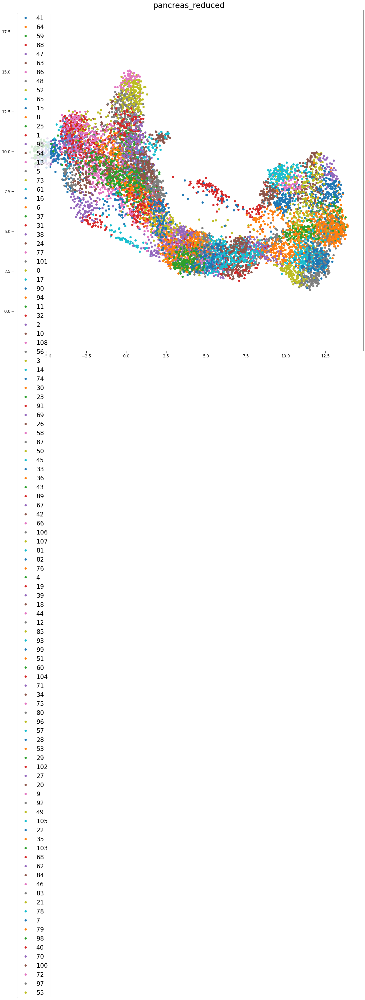

In [8]:
fig, ax = plt.subplots(1, figsize=(24,24))
plot_points(embedding, dataset, ax, labels)
plt.show()

In [9]:
np.argsort([1,2,36])

0 not in [1,2,3]

True

In [10]:
components = []
node_labels = [None for _ in range(number_of_nodes)]
for label in np.sort(unique_labels):
    component = np.argwhere(label == labels).T
    assert len(component) == 1
    
    for node in component[0]:
        node_labels[node] = label
        
    components.append(component[0].tolist())

sub_ICTs = []

# Put the clusters with #nodes < threshold to the cluster of the nearest node
# PCA since clusters are computed in pca space!
distances = pairwise_distances(pca, pca)

cleaned_components = [False for _ in range(len(unique_labels))]

while True:
    
    for idx, component in enumerate(components):
        
        if cleaned_components[idx] == True:
            continue
        
        if len(component) <= threshold:
            
            for node in component:
                nearests = np.argsort(distances[node])
                for elem in nearests:
                    if elem not in component:
                        nearest = elem
                node_labels[node] = node_labels[nearest]
                components[node_labels[nearest]].append(node)
                cleaned_components[idx] = True
                continue
    
    break

new_components = []
new_node_labels = [None for _ in range(number_of_nodes)]
    
for idx, component in enumerate(components):
    if cleaned_components[idx] == False:
        new_components.append(component)
        for node in component:
            new_node_labels[node] = idx
            
unique_labels = np.unique(new_node_labels)
components = new_components
node_labels = new_node_labels



for component in tqdm(components):
    
    sub_number_of_nodes = len(component)
    
    sub_G, _ = create_graph(sub_number_of_nodes, mode, position=pca[component], k=4,
                            beta=2, delta=0.5, bridges=11)
    sub_G.indexEdges()

    sub_ICT = calculate_ICT(sub_G, algorithm_type="exact_own",
                                   zeros_stay_zeros=True, update_G=1.1)
    sub_ICT.indexEdges()
    sub_ICTs.append(sub_ICT)

  0%|          | 0/108 [00:00<?, ?it/s]

calculating the densities for the density criterion:   0%|          | 0/90 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/295 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/295 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/295 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/89 [00:00<?, ?it/s]

update Arr 295 -> 268
update Arr 268 -> 241
update Arr 241 -> 218
update Arr 218 -> 196
update Arr 196 -> 178
update Arr 178 -> 159
update Arr 159 -> 143
update Arr 143 -> 128
update Arr 128 -> 114
update Arr 114 -> 103
update Arr 103 -> 99
update Arr 99 -> 99
update Arr 99 -> 97
update Arr 97 -> 94
update Arr 94 -> 94
update Arr 94 -> 92
update Arr 92 -> 91
update Arr 91 -> 90


calculating the densities for the density criterion:   0%|          | 0/120 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/427 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/427 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/427 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/119 [00:00<?, ?it/s]

update Arr 427 -> 380
update Arr 380 -> 343
update Arr 343 -> 299
update Arr 299 -> 271
update Arr 271 -> 246
update Arr 246 -> 223
update Arr 223 -> 201
update Arr 201 -> 181
update Arr 181 -> 164
update Arr 164 -> 149
update Arr 149 -> 135
update Arr 135 -> 128
update Arr 128 -> 125
update Arr 125 -> 123
update Arr 123 -> 122
update Arr 122 -> 122
update Arr 122 -> 121
update Arr 121 -> 120


calculating the densities for the density criterion:   0%|          | 0/164 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/574 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/574 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/574 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/163 [00:00<?, ?it/s]

update Arr 574 -> 513
update Arr 513 -> 462
update Arr 462 -> 419
update Arr 419 -> 379
update Arr 379 -> 344
update Arr 344 -> 311
update Arr 311 -> 281
update Arr 281 -> 255
update Arr 255 -> 231
update Arr 231 -> 209
update Arr 209 -> 189
update Arr 189 -> 172
update Arr 172 -> 167
added 2 edges early
update Arr 167 -> 167
update Arr 167 -> 166
update Arr 166 -> 166
update Arr 166 -> 165


calculating the densities for the density criterion:   0%|          | 0/40 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/138 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/138 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/138 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 138 -> 125
update Arr 125 -> 103
update Arr 103 -> 93
update Arr 93 -> 84
update Arr 84 -> 76
update Arr 76 -> 69
update Arr 69 -> 60
update Arr 60 -> 54
update Arr 54 -> 49
update Arr 49 -> 47
update Arr 47 -> 43
update Arr 43 -> 42
update Arr 42 -> 41
update Arr 41 -> 41
update Arr 41 -> 40


calculating the densities for the density criterion:   0%|          | 0/87 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/304 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/304 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/304 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/86 [00:00<?, ?it/s]

update Arr 304 -> 274
update Arr 274 -> 249
update Arr 249 -> 215
update Arr 215 -> 194
update Arr 194 -> 175
update Arr 175 -> 158
update Arr 158 -> 142
update Arr 142 -> 129
update Arr 129 -> 117
update Arr 117 -> 100
added 4 edges early
update Arr 100 -> 95
update Arr 95 -> 94
update Arr 94 -> 92
update Arr 92 -> 90
update Arr 90 -> 89


calculating the densities for the density criterion:   0%|          | 0/126 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/435 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/435 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/435 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/125 [00:00<?, ?it/s]

update Arr 435 -> 386
update Arr 386 -> 349
update Arr 349 -> 314
added 2 edges early
update Arr 314 -> 284
update Arr 284 -> 258
update Arr 258 -> 234
update Arr 234 -> 212
update Arr 212 -> 190
update Arr 190 -> 171
update Arr 171 -> 153
update Arr 153 -> 139
update Arr 139 -> 133
update Arr 133 -> 133
update Arr 133 -> 132
update Arr 132 -> 131
update Arr 131 -> 130
update Arr 130 -> 129
update Arr 129 -> 125


calculating the densities for the density criterion:   0%|          | 0/160 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/538 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/538 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/538 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/159 [00:00<?, ?it/s]

update Arr 538 -> 486
update Arr 486 -> 438
update Arr 438 -> 398
added 2 edges early
update Arr 398 -> 361
update Arr 361 -> 328
update Arr 328 -> 296
update Arr 296 -> 269
update Arr 269 -> 242
update Arr 242 -> 218
update Arr 218 -> 198
update Arr 198 -> 179
update Arr 179 -> 169
update Arr 169 -> 167
update Arr 167 -> 165
update Arr 165 -> 163
update Arr 163 -> 162
update Arr 162 -> 160


calculating the densities for the density criterion:   0%|          | 0/97 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/348 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/348 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/348 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/96 [00:00<?, ?it/s]

update Arr 348 -> 311
update Arr 311 -> 274
update Arr 274 -> 244
update Arr 244 -> 220
update Arr 220 -> 198
update Arr 198 -> 179
update Arr 179 -> 161
update Arr 161 -> 146
update Arr 146 -> 131
update Arr 131 -> 119
update Arr 119 -> 108
update Arr 108 -> 106
update Arr 106 -> 105
update Arr 105 -> 104
update Arr 104 -> 103
update Arr 103 -> 101
update Arr 101 -> 99
update Arr 99 -> 97


calculating the densities for the density criterion:   0%|          | 0/142 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/490 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/490 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/490 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/141 [00:00<?, ?it/s]

update Arr 490 -> 441
added 3 edges early
update Arr 441 -> 399
update Arr 399 -> 362
update Arr 362 -> 329
update Arr 329 -> 299
update Arr 299 -> 269
update Arr 269 -> 244
update Arr 244 -> 220
update Arr 220 -> 198
update Arr 198 -> 179
update Arr 179 -> 162
update Arr 162 -> 148
update Arr 148 -> 148
update Arr 148 -> 147
update Arr 147 -> 146
update Arr 146 -> 146
update Arr 146 -> 145
update Arr 145 -> 144
update Arr 144 -> 143


calculating the densities for the density criterion:   0%|          | 0/25 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/80 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/80 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/80 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/24 [00:00<?, ?it/s]

update Arr 80 -> 72
update Arr 72 -> 64
update Arr 64 -> 57
update Arr 57 -> 51
update Arr 51 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 32
update Arr 32 -> 29
update Arr 29 -> 28
update Arr 28 -> 27


calculating the densities for the density criterion:   0%|          | 0/22 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/69 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/69 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/69 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 69 -> 62
update Arr 62 -> 56
update Arr 56 -> 44
update Arr 44 -> 38
update Arr 38 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
update Arr 29 -> 28
update Arr 28 -> 24
update Arr 24 -> 23
update Arr 23 -> 22
update Arr 22 -> 22


calculating the densities for the density criterion:   0%|          | 0/189 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/649 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/649 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/649 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/188 [00:00<?, ?it/s]

update Arr 649 -> 579
added 3 edges early
update Arr 579 -> 522
update Arr 522 -> 470
added 2 edges early
update Arr 470 -> 427
update Arr 427 -> 388
update Arr 388 -> 352
update Arr 352 -> 319
update Arr 319 -> 288
update Arr 288 -> 261
update Arr 261 -> 235
update Arr 235 -> 211
update Arr 211 -> 198
update Arr 198 -> 196
update Arr 196 -> 196
update Arr 196 -> 195
update Arr 195 -> 193
update Arr 193 -> 192
update Arr 192 -> 191
update Arr 191 -> 189


calculating the densities for the density criterion:   0%|          | 0/93 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/318 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/318 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/318 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/92 [00:00<?, ?it/s]

update Arr 318 -> 274
update Arr 274 -> 248
update Arr 248 -> 220
update Arr 220 -> 199
update Arr 199 -> 178
update Arr 178 -> 160
update Arr 160 -> 145
update Arr 145 -> 131
update Arr 131 -> 118
update Arr 118 -> 107
update Arr 107 -> 102
update Arr 102 -> 101
update Arr 101 -> 100
update Arr 100 -> 98
update Arr 98 -> 96
update Arr 96 -> 93
update Arr 93 -> 93
update Arr 93 -> 92


calculating the densities for the density criterion:   0%|          | 0/46 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/152 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/152 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/152 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 152 -> 136
update Arr 136 -> 113
update Arr 113 -> 100
update Arr 100 -> 90
update Arr 90 -> 81
update Arr 81 -> 71
update Arr 71 -> 63
update Arr 63 -> 53
update Arr 53 -> 53
update Arr 53 -> 51
update Arr 51 -> 50
update Arr 50 -> 49
update Arr 49 -> 48


calculating the densities for the density criterion:   0%|          | 0/121 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/429 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/429 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/429 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/120 [00:00<?, ?it/s]

update Arr 429 -> 389
update Arr 389 -> 346
update Arr 346 -> 303
update Arr 303 -> 275
update Arr 275 -> 248
update Arr 248 -> 223
update Arr 223 -> 202
update Arr 202 -> 182
update Arr 182 -> 165
update Arr 165 -> 148
update Arr 148 -> 128
added 3 edges early
update Arr 128 -> 128
update Arr 128 -> 127
update Arr 127 -> 125
update Arr 125 -> 124
update Arr 124 -> 123
update Arr 123 -> 122
update Arr 122 -> 121


calculating the densities for the density criterion:   0%|          | 0/102 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/351 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/351 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/351 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/101 [00:00<?, ?it/s]

update Arr 351 -> 317
update Arr 317 -> 287
update Arr 287 -> 258
update Arr 258 -> 234
update Arr 234 -> 211
update Arr 211 -> 191
update Arr 191 -> 173
update Arr 173 -> 156
update Arr 156 -> 141
update Arr 141 -> 128
update Arr 128 -> 115
update Arr 115 -> 111
update Arr 111 -> 109
update Arr 109 -> 107
update Arr 107 -> 105
update Arr 105 -> 104
update Arr 104 -> 101
added 2 edges early


calculating the densities for the density criterion:   0%|          | 0/84 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/289 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/289 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/289 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/83 [00:00<?, ?it/s]

update Arr 289 -> 261
update Arr 261 -> 234
update Arr 234 -> 212
update Arr 212 -> 189
update Arr 189 -> 171
update Arr 171 -> 154
update Arr 154 -> 138
update Arr 138 -> 124
update Arr 124 -> 112
update Arr 112 -> 101
update Arr 101 -> 92
update Arr 92 -> 92
update Arr 92 -> 91
update Arr 91 -> 90
update Arr 90 -> 89
update Arr 89 -> 86
update Arr 86 -> 85


calculating the densities for the density criterion:   0%|          | 0/80 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/261 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/261 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/261 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/79 [00:00<?, ?it/s]

update Arr 261 -> 234
update Arr 234 -> 212
update Arr 212 -> 191
update Arr 191 -> 173
update Arr 173 -> 157
update Arr 157 -> 140
update Arr 140 -> 127
update Arr 127 -> 115
update Arr 115 -> 103
update Arr 103 -> 89
update Arr 89 -> 88
update Arr 88 -> 87
update Arr 87 -> 86
update Arr 86 -> 85
update Arr 85 -> 84
update Arr 84 -> 83
update Arr 83 -> 82
update Arr 82 -> 81
update Arr 81 -> 80


calculating the densities for the density criterion:   0%|          | 0/42 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/132 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/132 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/132 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 132 -> 118
update Arr 118 -> 101
update Arr 101 -> 90
update Arr 90 -> 80
update Arr 80 -> 70
update Arr 70 -> 63
update Arr 63 -> 57
update Arr 57 -> 50
update Arr 50 -> 50
update Arr 50 -> 49
update Arr 49 -> 48
update Arr 48 -> 47
update Arr 47 -> 46
update Arr 46 -> 45
update Arr 45 -> 43
update Arr 43 -> 42


calculating the densities for the density criterion:   0%|          | 0/61 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/210 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/210 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/210 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 210 -> 189
update Arr 189 -> 170
update Arr 170 -> 154
update Arr 154 -> 139
update Arr 139 -> 126
update Arr 126 -> 114
update Arr 114 -> 101
update Arr 101 -> 90
update Arr 90 -> 81
update Arr 81 -> 73
update Arr 73 -> 69
update Arr 69 -> 69
update Arr 69 -> 65
update Arr 65 -> 65
update Arr 65 -> 63
update Arr 63 -> 62
update Arr 62 -> 61


calculating the densities for the density criterion:   0%|          | 0/85 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/294 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/294 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/294 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/84 [00:00<?, ?it/s]

update Arr 294 -> 266
update Arr 266 -> 231
update Arr 231 -> 208
update Arr 208 -> 188
update Arr 188 -> 170
update Arr 170 -> 151
update Arr 151 -> 136
update Arr 136 -> 123
update Arr 123 -> 109
update Arr 109 -> 94
update Arr 94 -> 94
update Arr 94 -> 93
update Arr 93 -> 91
update Arr 91 -> 90
update Arr 90 -> 89
update Arr 89 -> 87
update Arr 87 -> 87
update Arr 87 -> 85


calculating the densities for the density criterion:   0%|          | 0/123 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/420 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/420 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/420 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/122 [00:00<?, ?it/s]

update Arr 420 -> 374
update Arr 374 -> 332
update Arr 332 -> 297
update Arr 297 -> 269
update Arr 269 -> 244
update Arr 244 -> 221
update Arr 221 -> 199
update Arr 199 -> 180
update Arr 180 -> 162
update Arr 162 -> 144
update Arr 144 -> 130
update Arr 130 -> 130
update Arr 130 -> 129
update Arr 129 -> 128
update Arr 128 -> 127
update Arr 127 -> 126
update Arr 126 -> 125
update Arr 125 -> 124


calculating the densities for the density criterion:   0%|          | 0/152 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/528 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/528 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/528 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/151 [00:00<?, ?it/s]

update Arr 528 -> 476
update Arr 476 -> 427
update Arr 427 -> 388
update Arr 388 -> 351
update Arr 351 -> 318
update Arr 318 -> 288
update Arr 288 -> 260
update Arr 260 -> 235
update Arr 235 -> 213
update Arr 213 -> 192
update Arr 192 -> 173
update Arr 173 -> 160
update Arr 160 -> 159
update Arr 159 -> 158
update Arr 158 -> 157
update Arr 157 -> 154
update Arr 154 -> 153
update Arr 153 -> 152
update Arr 152 -> 152


calculating the densities for the density criterion:   0%|          | 0/42 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/128 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/128 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/128 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 128 -> 114
update Arr 114 -> 102
update Arr 102 -> 91
update Arr 91 -> 82
update Arr 82 -> 74
update Arr 74 -> 66
update Arr 66 -> 58
update Arr 58 -> 51
update Arr 51 -> 49
update Arr 49 -> 48
update Arr 48 -> 45
update Arr 45 -> 43
update Arr 43 -> 43
update Arr 43 -> 41


calculating the densities for the density criterion:   0%|          | 0/31 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/110 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/110 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/110 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/30 [00:00<?, ?it/s]

update Arr 110 -> 96
update Arr 96 -> 85
update Arr 85 -> 76
update Arr 76 -> 69
update Arr 69 -> 62
update Arr 62 -> 50
update Arr 50 -> 44
update Arr 44 -> 40
update Arr 40 -> 34
update Arr 34 -> 34
update Arr 34 -> 33
update Arr 33 -> 32
update Arr 32 -> 32
update Arr 32 -> 31


calculating the densities for the density criterion:   0%|          | 0/42 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/147 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/41 [00:00<?, ?it/s]

update Arr 147 -> 123
update Arr 123 -> 108
update Arr 108 -> 98
update Arr 98 -> 88
update Arr 88 -> 76
update Arr 76 -> 69
update Arr 69 -> 62
update Arr 62 -> 55
update Arr 55 -> 50
update Arr 50 -> 49
update Arr 49 -> 47
update Arr 47 -> 45
update Arr 45 -> 44
update Arr 44 -> 43


calculating the densities for the density criterion:   0%|          | 0/37 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/121 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/121 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/121 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 121 -> 107
added 2 edges early
update Arr 107 -> 96
update Arr 96 -> 86
update Arr 86 -> 77
update Arr 77 -> 69
update Arr 69 -> 62
update Arr 62 -> 56
update Arr 56 -> 49
update Arr 49 -> 45
update Arr 45 -> 44
update Arr 44 -> 41
update Arr 41 -> 40
update Arr 40 -> 37
update Arr 37 -> 37


calculating the densities for the density criterion:   0%|          | 0/128 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/453 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/453 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/453 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/127 [00:00<?, ?it/s]

update Arr 453 -> 406
update Arr 406 -> 366
update Arr 366 -> 332
update Arr 332 -> 300
update Arr 300 -> 272
update Arr 272 -> 246
update Arr 246 -> 222
update Arr 222 -> 201
update Arr 201 -> 181
update Arr 181 -> 164
update Arr 164 -> 148
update Arr 148 -> 136
update Arr 136 -> 130
added 2 edges early
update Arr 130 -> 130
update Arr 130 -> 129
update Arr 129 -> 128


calculating the densities for the density criterion:   0%|          | 0/58 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/197 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/197 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/197 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/57 [00:00<?, ?it/s]

update Arr 197 -> 174
update Arr 174 -> 158
update Arr 158 -> 142
update Arr 142 -> 125
update Arr 125 -> 113
update Arr 113 -> 102
update Arr 102 -> 90
update Arr 90 -> 77
update Arr 77 -> 67
update Arr 67 -> 66
update Arr 66 -> 63
update Arr 63 -> 62
update Arr 62 -> 61
update Arr 61 -> 59


calculating the densities for the density criterion:   0%|          | 0/52 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/168 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/168 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/168 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/51 [00:00<?, ?it/s]

update Arr 168 -> 150
update Arr 150 -> 133
update Arr 133 -> 119
update Arr 119 -> 108
update Arr 108 -> 98
update Arr 98 -> 87
update Arr 87 -> 78
update Arr 78 -> 68
update Arr 68 -> 60
update Arr 60 -> 58
update Arr 58 -> 54
update Arr 54 -> 54
update Arr 54 -> 53
update Arr 53 -> 53
update Arr 53 -> 52


calculating the densities for the density criterion:   0%|          | 0/38 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/119 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/37 [00:00<?, ?it/s]

update Arr 119 -> 108
update Arr 108 -> 95
update Arr 95 -> 85
update Arr 85 -> 75
update Arr 75 -> 68
update Arr 68 -> 60
update Arr 60 -> 54
update Arr 54 -> 49
update Arr 49 -> 46
update Arr 46 -> 42
update Arr 42 -> 41
update Arr 41 -> 38
update Arr 38 -> 37


calculating the densities for the density criterion:   0%|          | 0/71 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/250 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/250 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/250 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/70 [00:00<?, ?it/s]

update Arr 250 -> 224
update Arr 224 -> 194
update Arr 194 -> 173
update Arr 173 -> 157
update Arr 157 -> 142
update Arr 142 -> 128
update Arr 128 -> 116
update Arr 116 -> 104
update Arr 104 -> 94
update Arr 94 -> 84
update Arr 84 -> 80
update Arr 80 -> 78
update Arr 78 -> 75
update Arr 75 -> 73
update Arr 73 -> 72
update Arr 72 -> 70


calculating the densities for the density criterion:   0%|          | 0/100 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/339 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/339 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/339 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/99 [00:00<?, ?it/s]

update Arr 339 -> 305
update Arr 305 -> 276
update Arr 276 -> 250
update Arr 250 -> 225
update Arr 225 -> 204
update Arr 204 -> 185
update Arr 185 -> 168
update Arr 168 -> 152
update Arr 152 -> 136
update Arr 136 -> 122
update Arr 122 -> 108
update Arr 108 -> 107
update Arr 107 -> 103
update Arr 103 -> 103
update Arr 103 -> 102
update Arr 102 -> 102
update Arr 102 -> 101
update Arr 101 -> 100


calculating the densities for the density criterion:   0%|          | 0/87 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/318 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/318 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/318 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/86 [00:00<?, ?it/s]

update Arr 318 -> 275
update Arr 275 -> 249
update Arr 249 -> 221
update Arr 221 -> 199
update Arr 199 -> 179
update Arr 179 -> 162
update Arr 162 -> 146
update Arr 146 -> 131
update Arr 131 -> 119
update Arr 119 -> 108
update Arr 108 -> 98
update Arr 98 -> 95
update Arr 95 -> 93
update Arr 93 -> 92
update Arr 92 -> 90
update Arr 90 -> 89
update Arr 89 -> 88


calculating the densities for the density criterion:   0%|          | 0/116 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/413 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/413 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/413 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/115 [00:00<?, ?it/s]

update Arr 413 -> 369
update Arr 369 -> 335
update Arr 335 -> 303
update Arr 303 -> 275
update Arr 275 -> 249
update Arr 249 -> 226
update Arr 226 -> 204
update Arr 204 -> 185
update Arr 185 -> 168
update Arr 168 -> 151
update Arr 151 -> 137
update Arr 137 -> 121
update Arr 121 -> 121
update Arr 121 -> 120
update Arr 120 -> 119
update Arr 119 -> 119
update Arr 119 -> 115
added 3 edges early


calculating the densities for the density criterion:   0%|          | 0/87 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/298 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/298 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/298 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/86 [00:00<?, ?it/s]

update Arr 298 -> 259
update Arr 259 -> 232
update Arr 232 -> 209
update Arr 209 -> 188
update Arr 188 -> 169
update Arr 169 -> 152
update Arr 152 -> 138
update Arr 138 -> 125
update Arr 125 -> 113
update Arr 113 -> 102
update Arr 102 -> 94
update Arr 94 -> 93
update Arr 93 -> 93
update Arr 93 -> 90
update Arr 90 -> 88
update Arr 88 -> 88
update Arr 88 -> 86


calculating the densities for the density criterion:   0%|          | 0/142 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/484 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/484 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/484 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/141 [00:00<?, ?it/s]

update Arr 484 -> 438
update Arr 438 -> 397
update Arr 397 -> 355
update Arr 355 -> 322
update Arr 322 -> 291
update Arr 291 -> 262
update Arr 262 -> 238
update Arr 238 -> 216
update Arr 216 -> 196
update Arr 196 -> 174
update Arr 174 -> 157
update Arr 157 -> 147
update Arr 147 -> 147
update Arr 147 -> 146
update Arr 146 -> 146
update Arr 146 -> 144
update Arr 144 -> 144
update Arr 144 -> 143


calculating the densities for the density criterion:   0%|          | 0/136 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/483 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/483 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/483 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/135 [00:00<?, ?it/s]

update Arr 483 -> 433
update Arr 433 -> 390
update Arr 390 -> 354
update Arr 354 -> 319
update Arr 319 -> 289
update Arr 289 -> 261
update Arr 261 -> 235
update Arr 235 -> 213
update Arr 213 -> 193
update Arr 193 -> 175
update Arr 175 -> 158
update Arr 158 -> 145
update Arr 145 -> 142
update Arr 142 -> 142
update Arr 142 -> 141
update Arr 141 -> 140
update Arr 140 -> 139
update Arr 139 -> 137


calculating the densities for the density criterion:   0%|          | 0/162 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/574 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/574 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/574 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/161 [00:00<?, ?it/s]

update Arr 574 -> 519
update Arr 519 -> 471
update Arr 471 -> 424
update Arr 424 -> 385
update Arr 385 -> 349
update Arr 349 -> 317
update Arr 317 -> 288
update Arr 288 -> 260
update Arr 260 -> 236
update Arr 236 -> 213
update Arr 213 -> 192
update Arr 192 -> 174
update Arr 174 -> 169
update Arr 169 -> 168
update Arr 168 -> 166
update Arr 166 -> 164
update Arr 164 -> 163
update Arr 163 -> 162


calculating the densities for the density criterion:   0%|          | 0/88 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/295 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/295 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/295 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/87 [00:00<?, ?it/s]

update Arr 295 -> 258
update Arr 258 -> 231
update Arr 231 -> 209
update Arr 209 -> 187
update Arr 187 -> 168
update Arr 168 -> 151
update Arr 151 -> 132
update Arr 132 -> 119
update Arr 119 -> 107
update Arr 107 -> 91
added 2 edges early
update Arr 91 -> 91
update Arr 91 -> 90
update Arr 90 -> 89
update Arr 89 -> 88


calculating the densities for the density criterion:   0%|          | 0/97 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/308 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/308 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/308 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/96 [00:00<?, ?it/s]

update Arr 308 -> 274
added 2 edges early
update Arr 274 -> 247
update Arr 247 -> 221
update Arr 221 -> 199
update Arr 199 -> 180
update Arr 180 -> 161
update Arr 161 -> 145
update Arr 145 -> 131
update Arr 131 -> 118
update Arr 118 -> 107
update Arr 107 -> 106
update Arr 106 -> 102
update Arr 102 -> 100
update Arr 100 -> 99
update Arr 99 -> 99
update Arr 99 -> 98
update Arr 98 -> 97


calculating the densities for the density criterion:   0%|          | 0/72 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/249 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/249 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/249 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/71 [00:00<?, ?it/s]

update Arr 249 -> 226
update Arr 226 -> 196
update Arr 196 -> 177
update Arr 177 -> 160
update Arr 160 -> 144
update Arr 144 -> 130
update Arr 130 -> 116
update Arr 116 -> 105
update Arr 105 -> 92
update Arr 92 -> 83
update Arr 83 -> 81
update Arr 81 -> 74
added 5 edges early
update Arr 74 -> 74
update Arr 74 -> 72
update Arr 72 -> 72


calculating the densities for the density criterion:   0%|          | 0/111 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/371 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/371 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/371 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/110 [00:00<?, ?it/s]

update Arr 371 -> 333
update Arr 333 -> 298
update Arr 298 -> 269
update Arr 269 -> 244
update Arr 244 -> 221
update Arr 221 -> 199
update Arr 199 -> 178
update Arr 178 -> 160
update Arr 160 -> 144
update Arr 144 -> 129
update Arr 129 -> 120
update Arr 120 -> 118
update Arr 118 -> 116
update Arr 116 -> 116
update Arr 116 -> 115
update Arr 115 -> 114
update Arr 114 -> 112
update Arr 112 -> 111


calculating the densities for the density criterion:   0%|          | 0/113 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/392 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/392 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/392 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/112 [00:00<?, ?it/s]

update Arr 392 -> 346
update Arr 346 -> 313
update Arr 313 -> 278
update Arr 278 -> 251
update Arr 251 -> 227
update Arr 227 -> 205
update Arr 205 -> 185
update Arr 185 -> 165
update Arr 165 -> 148
update Arr 148 -> 134
update Arr 134 -> 120
update Arr 120 -> 120
update Arr 120 -> 119
update Arr 119 -> 118
update Arr 118 -> 117
update Arr 117 -> 115


calculating the densities for the density criterion:   0%|          | 0/136 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/474 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/474 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/474 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/135 [00:00<?, ?it/s]

update Arr 474 -> 424
update Arr 424 -> 379
update Arr 379 -> 344
update Arr 344 -> 312
update Arr 312 -> 281
update Arr 281 -> 255
update Arr 255 -> 230
update Arr 230 -> 208
update Arr 208 -> 189
update Arr 189 -> 168
update Arr 168 -> 151
update Arr 151 -> 145
update Arr 145 -> 141
update Arr 141 -> 138
update Arr 138 -> 138
update Arr 138 -> 136
update Arr 136 -> 136


calculating the densities for the density criterion:   0%|          | 0/56 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/198 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 198 -> 172
update Arr 172 -> 153
added 2 edges early
update Arr 153 -> 138
update Arr 138 -> 124
update Arr 124 -> 111
update Arr 111 -> 100
update Arr 100 -> 89
update Arr 89 -> 79
update Arr 79 -> 71
update Arr 71 -> 65
update Arr 65 -> 63
update Arr 63 -> 61
update Arr 61 -> 57
update Arr 57 -> 57
update Arr 57 -> 56


calculating the densities for the density criterion:   0%|          | 0/95 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/342 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/342 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/342 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/94 [00:00<?, ?it/s]

update Arr 342 -> 308
update Arr 308 -> 278
update Arr 278 -> 252
update Arr 252 -> 229
update Arr 229 -> 207
update Arr 207 -> 187
update Arr 187 -> 167
update Arr 167 -> 151
update Arr 151 -> 137
update Arr 137 -> 124
update Arr 124 -> 110
update Arr 110 -> 103
update Arr 103 -> 102
update Arr 102 -> 98
update Arr 98 -> 97
update Arr 97 -> 96
update Arr 96 -> 96
update Arr 96 -> 95


calculating the densities for the density criterion:   0%|          | 0/212 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/735 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/735 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/735 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/211 [00:00<?, ?it/s]

update Arr 735 -> 660
added 4 edges early
update Arr 660 -> 599
update Arr 599 -> 544
added 2 edges early
update Arr 544 -> 493
update Arr 493 -> 448
update Arr 448 -> 407
update Arr 407 -> 369
update Arr 369 -> 332
update Arr 332 -> 300
update Arr 300 -> 270
update Arr 270 -> 244
update Arr 244 -> 221
update Arr 221 -> 218
update Arr 218 -> 217
update Arr 217 -> 215
update Arr 215 -> 215
update Arr 215 -> 214
update Arr 214 -> 213
update Arr 213 -> 212


calculating the densities for the density criterion:   0%|          | 0/64 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/225 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/225 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/225 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/63 [00:00<?, ?it/s]

update Arr 225 -> 204
update Arr 204 -> 185
update Arr 185 -> 162
update Arr 162 -> 146
update Arr 146 -> 132
update Arr 132 -> 118
update Arr 118 -> 106
update Arr 106 -> 96
update Arr 96 -> 87
update Arr 87 -> 79
update Arr 79 -> 71
update Arr 71 -> 71
update Arr 71 -> 70
update Arr 70 -> 69
update Arr 69 -> 67
update Arr 67 -> 64
update Arr 64 -> 64


calculating the densities for the density criterion:   0%|          | 0/75 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/258 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/258 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/258 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/74 [00:00<?, ?it/s]

update Arr 258 -> 230
update Arr 230 -> 206
update Arr 206 -> 186
update Arr 186 -> 169
update Arr 169 -> 151
update Arr 151 -> 137
update Arr 137 -> 122
update Arr 122 -> 110
update Arr 110 -> 99
update Arr 99 -> 89
update Arr 89 -> 84
update Arr 84 -> 82
update Arr 82 -> 81
update Arr 81 -> 79
update Arr 79 -> 77
update Arr 77 -> 77
update Arr 77 -> 75


calculating the densities for the density criterion:   0%|          | 0/136 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/472 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/472 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/472 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/135 [00:00<?, ?it/s]

update Arr 472 -> 424
update Arr 424 -> 383
update Arr 383 -> 348
update Arr 348 -> 314
update Arr 314 -> 285
update Arr 285 -> 259
update Arr 259 -> 235
update Arr 235 -> 213
update Arr 213 -> 191
update Arr 191 -> 173
update Arr 173 -> 156
update Arr 156 -> 145
update Arr 145 -> 144
update Arr 144 -> 142
update Arr 142 -> 141
update Arr 141 -> 139
update Arr 139 -> 138
update Arr 138 -> 137


calculating the densities for the density criterion:   0%|          | 0/54 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/170 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/170 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/170 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/53 [00:00<?, ?it/s]

update Arr 170 -> 154
update Arr 154 -> 136
update Arr 136 -> 120
update Arr 120 -> 108
update Arr 108 -> 98
update Arr 98 -> 89
update Arr 89 -> 80
update Arr 80 -> 72
update Arr 72 -> 65
update Arr 65 -> 60
update Arr 60 -> 59
update Arr 59 -> 57
update Arr 57 -> 56
update Arr 56 -> 55
update Arr 55 -> 54


calculating the densities for the density criterion:   0%|          | 0/83 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/292 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/292 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/292 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/82 [00:00<?, ?it/s]

update Arr 292 -> 259
update Arr 259 -> 234
update Arr 234 -> 210
update Arr 210 -> 189
update Arr 189 -> 171
update Arr 171 -> 153
update Arr 153 -> 138
update Arr 138 -> 125
update Arr 125 -> 113
update Arr 113 -> 102
update Arr 102 -> 90
update Arr 90 -> 90
update Arr 90 -> 89
update Arr 89 -> 88
update Arr 88 -> 87
update Arr 87 -> 85
update Arr 85 -> 84
update Arr 84 -> 83


calculating the densities for the density criterion:   0%|          | 0/136 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/478 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/478 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/478 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/135 [00:00<?, ?it/s]

update Arr 478 -> 429
update Arr 429 -> 381
update Arr 381 -> 340
added 3 edges early
update Arr 340 -> 308
update Arr 308 -> 278
update Arr 278 -> 252
update Arr 252 -> 229
update Arr 229 -> 208
update Arr 208 -> 189
update Arr 189 -> 170
update Arr 170 -> 153
update Arr 153 -> 145
update Arr 145 -> 142
update Arr 142 -> 141
update Arr 141 -> 140
update Arr 140 -> 135
added 4 edges early


calculating the densities for the density criterion:   0%|          | 0/94 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/321 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/321 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/321 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/93 [00:00<?, ?it/s]

update Arr 321 -> 289
update Arr 289 -> 261
update Arr 261 -> 237
update Arr 237 -> 215
update Arr 215 -> 194
update Arr 194 -> 175
update Arr 175 -> 157
update Arr 157 -> 139
update Arr 139 -> 126
update Arr 126 -> 114
update Arr 114 -> 103
update Arr 103 -> 103
update Arr 103 -> 102
update Arr 102 -> 102
update Arr 102 -> 100
update Arr 100 -> 99
update Arr 99 -> 97
update Arr 97 -> 95


calculating the densities for the density criterion:   0%|          | 0/44 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/155 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/155 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/155 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 155 -> 140
update Arr 140 -> 126
update Arr 126 -> 113
update Arr 113 -> 100
update Arr 100 -> 89
update Arr 89 -> 80
update Arr 80 -> 72
update Arr 72 -> 63
update Arr 63 -> 56
update Arr 56 -> 51
update Arr 51 -> 50
update Arr 50 -> 49
update Arr 49 -> 48
update Arr 48 -> 47
update Arr 47 -> 44
update Arr 44 -> 44


calculating the densities for the density criterion:   0%|          | 0/209 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/734 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/734 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/734 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/208 [00:00<?, ?it/s]

update Arr 734 -> 663
update Arr 663 -> 600
update Arr 600 -> 540
update Arr 540 -> 489
update Arr 489 -> 444
update Arr 444 -> 402
update Arr 402 -> 363
update Arr 363 -> 329
update Arr 329 -> 299
update Arr 299 -> 271
update Arr 271 -> 245
update Arr 245 -> 222
update Arr 222 -> 215
update Arr 215 -> 215
update Arr 215 -> 214
update Arr 214 -> 214
update Arr 214 -> 213
update Arr 213 -> 212
update Arr 212 -> 210


calculating the densities for the density criterion:   0%|          | 0/76 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/261 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/261 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/261 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/75 [00:00<?, ?it/s]

update Arr 261 -> 233
update Arr 233 -> 210
update Arr 210 -> 190
update Arr 190 -> 171
update Arr 171 -> 154
update Arr 154 -> 138
update Arr 138 -> 125
update Arr 125 -> 113
update Arr 113 -> 102
update Arr 102 -> 87
update Arr 87 -> 85
update Arr 85 -> 83
update Arr 83 -> 79
update Arr 79 -> 79
update Arr 79 -> 78
update Arr 78 -> 77


calculating the densities for the density criterion:   0%|          | 0/110 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/391 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/391 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/391 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/109 [00:00<?, ?it/s]

update Arr 391 -> 349
added 3 edges early
update Arr 349 -> 315
update Arr 315 -> 282
update Arr 282 -> 255
update Arr 255 -> 231
update Arr 231 -> 209
update Arr 209 -> 188
update Arr 188 -> 169
update Arr 169 -> 151
update Arr 151 -> 137
update Arr 137 -> 123
update Arr 123 -> 118
update Arr 118 -> 117
update Arr 117 -> 113
added 2 edges early
update Arr 113 -> 113
update Arr 113 -> 112
update Arr 112 -> 110


calculating the densities for the density criterion:   0%|          | 0/125 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/453 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/453 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/453 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/124 [00:00<?, ?it/s]

update Arr 453 -> 406
update Arr 406 -> 365
update Arr 365 -> 326
added 2 edges early
update Arr 326 -> 295
update Arr 295 -> 268
update Arr 268 -> 243
update Arr 243 -> 219
update Arr 219 -> 197
update Arr 197 -> 179
update Arr 179 -> 161
update Arr 161 -> 144
update Arr 144 -> 133
update Arr 133 -> 132
update Arr 132 -> 130
update Arr 130 -> 129
update Arr 129 -> 128
update Arr 128 -> 127
update Arr 127 -> 125


calculating the densities for the density criterion:   0%|          | 0/126 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/412 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/412 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/412 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/125 [00:00<?, ?it/s]

update Arr 412 -> 368
update Arr 368 -> 329
added 2 edges early
update Arr 329 -> 299
update Arr 299 -> 271
update Arr 271 -> 246
update Arr 246 -> 223
update Arr 223 -> 201
update Arr 201 -> 178
update Arr 178 -> 161
update Arr 161 -> 146
update Arr 146 -> 131
update Arr 131 -> 131
update Arr 131 -> 130
update Arr 130 -> 129
update Arr 129 -> 129
update Arr 129 -> 128
update Arr 128 -> 127
update Arr 127 -> 126


calculating the densities for the density criterion:   0%|          | 0/76 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/253 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/253 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/253 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/75 [00:00<?, ?it/s]

update Arr 253 -> 224
update Arr 224 -> 202
update Arr 202 -> 183
update Arr 183 -> 164
update Arr 164 -> 149
update Arr 149 -> 135
update Arr 135 -> 120
update Arr 120 -> 108
update Arr 108 -> 97
update Arr 97 -> 85
update Arr 85 -> 85
update Arr 85 -> 84
update Arr 84 -> 83
update Arr 83 -> 81
update Arr 81 -> 80
update Arr 80 -> 79
update Arr 79 -> 78
update Arr 78 -> 77


calculating the densities for the density criterion:   0%|          | 0/95 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/318 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/318 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/318 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/94 [00:00<?, ?it/s]

update Arr 318 -> 289
update Arr 289 -> 260
update Arr 260 -> 236
update Arr 236 -> 214
update Arr 214 -> 194
update Arr 194 -> 176
update Arr 176 -> 159
update Arr 159 -> 143
update Arr 143 -> 129
update Arr 129 -> 117
update Arr 117 -> 106
update Arr 106 -> 104
update Arr 104 -> 100
update Arr 100 -> 100
update Arr 100 -> 99
update Arr 99 -> 98
update Arr 98 -> 96


calculating the densities for the density criterion:   0%|          | 0/93 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/314 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/314 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/314 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/92 [00:00<?, ?it/s]

update Arr 314 -> 282
added 2 edges early
update Arr 282 -> 252
update Arr 252 -> 222
update Arr 222 -> 201
update Arr 201 -> 182
update Arr 182 -> 165
update Arr 165 -> 149
update Arr 149 -> 134
update Arr 134 -> 121
update Arr 121 -> 109
update Arr 109 -> 102
update Arr 102 -> 101
update Arr 101 -> 99
update Arr 99 -> 99
update Arr 99 -> 98
update Arr 98 -> 97
update Arr 97 -> 93
update Arr 93 -> 93
update Arr 93 -> 92


calculating the densities for the density criterion:   0%|          | 0/56 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/175 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/175 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/175 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 175 -> 156
update Arr 156 -> 139
update Arr 139 -> 125
update Arr 125 -> 112
update Arr 112 -> 101
update Arr 101 -> 91
update Arr 91 -> 81
update Arr 81 -> 71
update Arr 71 -> 63
update Arr 63 -> 63
update Arr 63 -> 62
update Arr 62 -> 60
update Arr 60 -> 58
update Arr 58 -> 56


calculating the densities for the density criterion:   0%|          | 0/68 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/244 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/244 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/244 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/67 [00:00<?, ?it/s]

update Arr 244 -> 211
update Arr 211 -> 191
update Arr 191 -> 171
update Arr 171 -> 154
update Arr 154 -> 138
update Arr 138 -> 123
update Arr 123 -> 111
update Arr 111 -> 99
update Arr 99 -> 87
update Arr 87 -> 78
update Arr 78 -> 72
update Arr 72 -> 72
update Arr 72 -> 71
update Arr 71 -> 71
update Arr 71 -> 70
update Arr 70 -> 69
update Arr 69 -> 68


calculating the densities for the density criterion:   0%|          | 0/135 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/472 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/472 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/472 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/134 [00:00<?, ?it/s]

update Arr 472 -> 428
update Arr 428 -> 377
added 2 edges early
update Arr 377 -> 342
update Arr 342 -> 310
update Arr 310 -> 280
update Arr 280 -> 253
update Arr 253 -> 229
update Arr 229 -> 206
update Arr 206 -> 186
update Arr 186 -> 168
update Arr 168 -> 152
update Arr 152 -> 144
update Arr 144 -> 141
update Arr 141 -> 141
update Arr 141 -> 139
update Arr 139 -> 138
update Arr 138 -> 137
update Arr 137 -> 136
update Arr 136 -> 135


calculating the densities for the density criterion:   0%|          | 0/108 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/389 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/389 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/389 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/107 [00:00<?, ?it/s]

update Arr 389 -> 346
added 2 edges early
update Arr 346 -> 303
update Arr 303 -> 271
update Arr 271 -> 245
update Arr 245 -> 221
update Arr 221 -> 199
update Arr 199 -> 180
update Arr 180 -> 163
update Arr 163 -> 148
update Arr 148 -> 133
update Arr 133 -> 115
update Arr 115 -> 115
update Arr 115 -> 114
update Arr 114 -> 113
update Arr 113 -> 112
update Arr 112 -> 109
update Arr 109 -> 109
update Arr 109 -> 108


calculating the densities for the density criterion:   0%|          | 0/54 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/182 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/182 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/182 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/53 [00:00<?, ?it/s]

update Arr 182 -> 162
update Arr 162 -> 147
update Arr 147 -> 124
update Arr 124 -> 111
update Arr 111 -> 99
update Arr 99 -> 88
update Arr 88 -> 79
update Arr 79 -> 70
update Arr 70 -> 63
update Arr 63 -> 60
update Arr 60 -> 60
update Arr 60 -> 59
update Arr 59 -> 58
update Arr 58 -> 57
update Arr 57 -> 54


calculating the densities for the density criterion:   0%|          | 0/112 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/400 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/400 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/400 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/111 [00:00<?, ?it/s]

update Arr 400 -> 359
update Arr 359 -> 326
update Arr 326 -> 296
added 2 edges early
update Arr 296 -> 269
update Arr 269 -> 244
update Arr 244 -> 219
update Arr 219 -> 198
update Arr 198 -> 177
update Arr 177 -> 160
update Arr 160 -> 145
update Arr 145 -> 130
update Arr 130 -> 121
update Arr 121 -> 120
update Arr 120 -> 119
update Arr 119 -> 118
update Arr 118 -> 117
update Arr 117 -> 116
update Arr 116 -> 114
update Arr 114 -> 113
update Arr 113 -> 112


calculating the densities for the density criterion:   0%|          | 0/56 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/187 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/187 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/187 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 187 -> 167
update Arr 167 -> 149
update Arr 149 -> 135
update Arr 135 -> 121
update Arr 121 -> 109
update Arr 109 -> 99
update Arr 99 -> 89
update Arr 89 -> 78
update Arr 78 -> 66
update Arr 66 -> 65
update Arr 65 -> 64
update Arr 64 -> 62
update Arr 62 -> 61
update Arr 61 -> 60
update Arr 60 -> 59
update Arr 59 -> 57


calculating the densities for the density criterion:   0%|          | 0/115 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/417 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/417 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/417 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/114 [00:00<?, ?it/s]

update Arr 417 -> 373
update Arr 373 -> 339
update Arr 339 -> 303
update Arr 303 -> 274
update Arr 274 -> 249
update Arr 249 -> 225
update Arr 225 -> 204
update Arr 204 -> 184
update Arr 184 -> 166
update Arr 166 -> 149
update Arr 149 -> 134
update Arr 134 -> 124
update Arr 124 -> 117
added 3 edges early
update Arr 117 -> 117
update Arr 117 -> 114


calculating the densities for the density criterion:   0%|          | 0/96 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/309 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/309 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/309 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/95 [00:00<?, ?it/s]

update Arr 309 -> 279
update Arr 279 -> 253
update Arr 253 -> 227
update Arr 227 -> 206
update Arr 206 -> 184
update Arr 184 -> 167
update Arr 167 -> 150
update Arr 150 -> 136
update Arr 136 -> 121
update Arr 121 -> 109
update Arr 109 -> 105
update Arr 105 -> 104
update Arr 104 -> 101
update Arr 101 -> 101
update Arr 101 -> 100
update Arr 100 -> 98
update Arr 98 -> 97


calculating the densities for the density criterion:   0%|          | 0/51 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/166 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/166 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/166 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/50 [00:00<?, ?it/s]

update Arr 166 -> 147
update Arr 147 -> 132
update Arr 132 -> 119
update Arr 119 -> 108
update Arr 108 -> 94
update Arr 94 -> 85
update Arr 85 -> 77
update Arr 77 -> 67
update Arr 67 -> 59
update Arr 59 -> 59
update Arr 59 -> 55
update Arr 55 -> 55
update Arr 55 -> 53
update Arr 53 -> 52


calculating the densities for the density criterion:   0%|          | 0/59 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/197 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/197 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/197 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/58 [00:00<?, ?it/s]

update Arr 197 -> 172
update Arr 172 -> 156
update Arr 156 -> 140
update Arr 140 -> 126
update Arr 126 -> 114
update Arr 114 -> 103
update Arr 103 -> 91
update Arr 91 -> 82
update Arr 82 -> 74
update Arr 74 -> 67
update Arr 67 -> 66
update Arr 66 -> 64
update Arr 64 -> 62
update Arr 62 -> 59


calculating the densities for the density criterion:   0%|          | 0/167 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/577 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/577 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/577 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/166 [00:00<?, ?it/s]

update Arr 577 -> 523
update Arr 523 -> 466
added 2 edges early
update Arr 466 -> 420
update Arr 420 -> 381
update Arr 381 -> 346
update Arr 346 -> 313
update Arr 313 -> 284
update Arr 284 -> 258
update Arr 258 -> 234
update Arr 234 -> 212
update Arr 212 -> 191
update Arr 191 -> 173
added 2 edges early
update Arr 173 -> 173
update Arr 173 -> 172
update Arr 172 -> 172
update Arr 172 -> 171
update Arr 171 -> 169
update Arr 169 -> 168


calculating the densities for the density criterion:   0%|          | 0/89 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/299 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/299 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/299 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/88 [00:00<?, ?it/s]

update Arr 299 -> 268
update Arr 268 -> 240
update Arr 240 -> 217
update Arr 217 -> 196
update Arr 196 -> 177
update Arr 177 -> 158
update Arr 158 -> 143
update Arr 143 -> 129
update Arr 129 -> 117
update Arr 117 -> 106
update Arr 106 -> 98
update Arr 98 -> 94
update Arr 94 -> 93
update Arr 93 -> 91
update Arr 91 -> 90
update Arr 90 -> 89


Patching the components together:   0%|          | 0/2 [00:00<?, ?it/s]

calculating the densities for the density criterion:   0%|          | 0/17 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/59 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/59 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/59 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/16 [00:00<?, ?it/s]

update Arr 59 -> 46
update Arr 46 -> 39
update Arr 39 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 23
update Arr 23 -> 21
update Arr 21 -> 18
update Arr 18 -> 16


calculating the densities for the density criterion:   0%|          | 0/91 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/310 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/310 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/310 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/90 [00:00<?, ?it/s]

update Arr 310 -> 278
update Arr 278 -> 250
update Arr 250 -> 226
update Arr 226 -> 204
update Arr 204 -> 183
update Arr 183 -> 166
update Arr 166 -> 149
update Arr 149 -> 135
update Arr 135 -> 122
update Arr 122 -> 110
update Arr 110 -> 99
update Arr 99 -> 98
update Arr 98 -> 96
update Arr 96 -> 96
update Arr 96 -> 95
update Arr 95 -> 93
update Arr 93 -> 92
update Arr 92 -> 91


calculating the densities for the density criterion:   0%|          | 0/95 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/340 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/340 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/340 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/94 [00:00<?, ?it/s]

update Arr 340 -> 305
update Arr 305 -> 271
update Arr 271 -> 244
added 4 edges early
update Arr 244 -> 221
update Arr 221 -> 199
update Arr 199 -> 180
update Arr 180 -> 163
update Arr 163 -> 148
update Arr 148 -> 133
update Arr 133 -> 119
update Arr 119 -> 108
update Arr 108 -> 103
update Arr 103 -> 95
added 4 edges early
update Arr 95 -> 95
update Arr 95 -> 94


calculating the densities for the density criterion:   0%|          | 0/159 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/560 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/560 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/560 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/158 [00:00<?, ?it/s]

update Arr 560 -> 495
update Arr 495 -> 446
update Arr 446 -> 388
update Arr 388 -> 352
update Arr 352 -> 319
update Arr 319 -> 288
update Arr 288 -> 259
update Arr 259 -> 235
update Arr 235 -> 212
update Arr 212 -> 189
update Arr 189 -> 171
update Arr 171 -> 168
update Arr 168 -> 165
update Arr 165 -> 164
update Arr 164 -> 161
update Arr 161 -> 159


calculating the densities for the density criterion:   0%|          | 0/68 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/227 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/227 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/227 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/67 [00:00<?, ?it/s]

update Arr 227 -> 197
added 2 edges early
update Arr 197 -> 178
update Arr 178 -> 158
update Arr 158 -> 143
update Arr 143 -> 129
update Arr 129 -> 116
update Arr 116 -> 101
update Arr 101 -> 90
update Arr 90 -> 80
update Arr 80 -> 77
update Arr 77 -> 76
update Arr 76 -> 71
update Arr 71 -> 71
update Arr 71 -> 69
update Arr 69 -> 68


calculating the densities for the density criterion:   0%|          | 0/51 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/184 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/184 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/184 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/50 [00:00<?, ?it/s]

update Arr 184 -> 166
update Arr 166 -> 145
update Arr 145 -> 129
update Arr 129 -> 117
update Arr 117 -> 105
update Arr 105 -> 94
update Arr 94 -> 84
update Arr 84 -> 76
update Arr 76 -> 69
update Arr 69 -> 62
update Arr 62 -> 57
update Arr 57 -> 56
update Arr 56 -> 56
update Arr 56 -> 55
update Arr 55 -> 53


calculating the densities for the density criterion:   0%|          | 0/143 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/497 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/497 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/497 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/142 [00:00<?, ?it/s]

update Arr 497 -> 448
update Arr 448 -> 404
update Arr 404 -> 361
update Arr 361 -> 327
update Arr 327 -> 296
update Arr 296 -> 267
update Arr 267 -> 241
update Arr 241 -> 219
update Arr 219 -> 197
update Arr 197 -> 179
update Arr 179 -> 161
update Arr 161 -> 147
update Arr 147 -> 147
update Arr 147 -> 146
update Arr 146 -> 145
update Arr 145 -> 144
update Arr 144 -> 143
update Arr 143 -> 143


calculating the densities for the density criterion:   0%|          | 0/24 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/68 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/68 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/68 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 68 -> 60
update Arr 60 -> 50
update Arr 50 -> 45
update Arr 45 -> 40
update Arr 40 -> 36
update Arr 36 -> 31
update Arr 31 -> 31
update Arr 31 -> 31
update Arr 31 -> 30
update Arr 30 -> 29
update Arr 29 -> 25
update Arr 25 -> 25


calculating the densities for the density criterion:   0%|          | 0/103 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/349 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/349 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/349 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/102 [00:00<?, ?it/s]

update Arr 349 -> 314
update Arr 314 -> 285
update Arr 285 -> 258
update Arr 258 -> 233
update Arr 233 -> 210
update Arr 210 -> 187
update Arr 187 -> 169
update Arr 169 -> 152
update Arr 152 -> 137
update Arr 137 -> 124
update Arr 124 -> 112
update Arr 112 -> 109
update Arr 109 -> 106
update Arr 106 -> 103
added 2 edges early
update Arr 103 -> 103


calculating the densities for the density criterion:   0%|          | 0/123 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/434 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/434 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/434 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/122 [00:00<?, ?it/s]

update Arr 434 -> 386
update Arr 386 -> 347
added 2 edges early
update Arr 347 -> 307
added 2 edges early
update Arr 307 -> 279
update Arr 279 -> 253
update Arr 253 -> 227
update Arr 227 -> 204
update Arr 204 -> 185
update Arr 185 -> 168
update Arr 168 -> 152
update Arr 152 -> 138
update Arr 138 -> 132
update Arr 132 -> 127
update Arr 127 -> 127
update Arr 127 -> 126
update Arr 126 -> 125
update Arr 125 -> 123


calculating the densities for the density criterion:   0%|          | 0/78 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/268 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/268 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/268 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/77 [00:00<?, ?it/s]

update Arr 268 -> 235
update Arr 235 -> 211
update Arr 211 -> 182
update Arr 182 -> 165
update Arr 165 -> 149
update Arr 149 -> 135
update Arr 135 -> 121
update Arr 121 -> 106
update Arr 106 -> 96
update Arr 96 -> 86
update Arr 86 -> 84
update Arr 84 -> 83
update Arr 83 -> 82
update Arr 82 -> 80
update Arr 80 -> 79
update Arr 79 -> 78


calculating the densities for the density criterion:   0%|          | 0/109 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/382 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/382 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/382 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/108 [00:00<?, ?it/s]

update Arr 382 -> 345
update Arr 345 -> 306
update Arr 306 -> 271
update Arr 271 -> 246
update Arr 246 -> 223
update Arr 223 -> 202
update Arr 202 -> 182
update Arr 182 -> 165
update Arr 165 -> 149
update Arr 149 -> 132
update Arr 132 -> 119
update Arr 119 -> 118
update Arr 118 -> 117
update Arr 117 -> 116
update Arr 116 -> 114
update Arr 114 -> 113
update Arr 113 -> 111
update Arr 111 -> 111
update Arr 111 -> 109


calculating the densities for the density criterion:   0%|          | 0/39 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/134 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/134 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/134 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/38 [00:00<?, ?it/s]

update Arr 134 -> 121
update Arr 121 -> 108
update Arr 108 -> 97
update Arr 97 -> 87
update Arr 87 -> 77
update Arr 77 -> 69
update Arr 69 -> 62
update Arr 62 -> 56
update Arr 56 -> 50
update Arr 50 -> 46
update Arr 46 -> 44
update Arr 44 -> 42
update Arr 42 -> 41
update Arr 41 -> 41


calculating the densities for the density criterion:   0%|          | 0/37 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/118 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36 [00:00<?, ?it/s]

update Arr 118 -> 106
update Arr 106 -> 95
update Arr 95 -> 85
update Arr 85 -> 76
update Arr 76 -> 69
update Arr 69 -> 62
update Arr 62 -> 53
update Arr 53 -> 46
update Arr 46 -> 45
update Arr 45 -> 45
update Arr 45 -> 44
update Arr 44 -> 42
update Arr 42 -> 39
update Arr 39 -> 37


calculating the densities for the density criterion:   0%|          | 0/131 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/463 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/463 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/463 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/130 [00:00<?, ?it/s]

update Arr 463 -> 417
update Arr 417 -> 379
update Arr 379 -> 333
update Arr 333 -> 301
update Arr 301 -> 273
update Arr 273 -> 248
update Arr 248 -> 224
update Arr 224 -> 203
update Arr 203 -> 184
update Arr 184 -> 166
update Arr 166 -> 150
update Arr 150 -> 140
update Arr 140 -> 138
update Arr 138 -> 137
update Arr 137 -> 133
update Arr 133 -> 133
update Arr 133 -> 132


calculating the densities for the density criterion:   0%|          | 0/89 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/300 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/300 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/300 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/88 [00:00<?, ?it/s]

update Arr 300 -> 272
update Arr 272 -> 243
update Arr 243 -> 220
update Arr 220 -> 199
update Arr 199 -> 180
update Arr 180 -> 162
update Arr 162 -> 147
update Arr 147 -> 131
update Arr 131 -> 119
update Arr 119 -> 108
update Arr 108 -> 98
update Arr 98 -> 94
update Arr 94 -> 94
update Arr 94 -> 93
update Arr 93 -> 90
update Arr 90 -> 90
update Arr 90 -> 89


calculating the densities for the density criterion:   0%|          | 0/152 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/524 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/524 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/524 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/151 [00:00<?, ?it/s]

update Arr 524 -> 475
update Arr 475 -> 426
update Arr 426 -> 376
update Arr 376 -> 340
update Arr 340 -> 308
update Arr 308 -> 279
update Arr 279 -> 251
update Arr 251 -> 228
update Arr 228 -> 207
update Arr 207 -> 185
update Arr 185 -> 168
added 2 edges early
update Arr 168 -> 160
update Arr 160 -> 159
update Arr 159 -> 158
update Arr 158 -> 156
update Arr 156 -> 155
update Arr 155 -> 154
update Arr 154 -> 153


calculating the densities for the density criterion:   0%|          | 0/52 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/167 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/167 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/167 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/51 [00:00<?, ?it/s]

update Arr 167 -> 151
update Arr 151 -> 135
update Arr 135 -> 122
update Arr 122 -> 110
update Arr 110 -> 98
update Arr 98 -> 88
update Arr 88 -> 78
update Arr 78 -> 70
update Arr 70 -> 62
update Arr 62 -> 58
update Arr 58 -> 57
update Arr 57 -> 56
update Arr 56 -> 53
update Arr 53 -> 52
update Arr 52 -> 52


calculating the densities for the density criterion:   0%|          | 0/107 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/382 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/382 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/382 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/106 [00:00<?, ?it/s]

update Arr 382 -> 337
update Arr 337 -> 300
update Arr 300 -> 272
update Arr 272 -> 247
update Arr 247 -> 219
update Arr 219 -> 199
update Arr 199 -> 180
update Arr 180 -> 163
update Arr 163 -> 148
update Arr 148 -> 132
update Arr 132 -> 119
update Arr 119 -> 116
update Arr 116 -> 115
update Arr 115 -> 113
update Arr 113 -> 111
update Arr 111 -> 109
update Arr 109 -> 108


calculating the densities for the density criterion:   0%|          | 0/112 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/385 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/385 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/385 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/111 [00:00<?, ?it/s]

update Arr 385 -> 345
update Arr 345 -> 311
update Arr 311 -> 280
update Arr 280 -> 254
update Arr 254 -> 230
update Arr 230 -> 209
update Arr 209 -> 188
update Arr 188 -> 170
update Arr 170 -> 150
update Arr 150 -> 136
update Arr 136 -> 122
update Arr 122 -> 120
update Arr 120 -> 119
update Arr 119 -> 115
update Arr 115 -> 115
update Arr 115 -> 113
update Arr 113 -> 112


calculating the densities for the density criterion:   0%|          | 0/128 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/464 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/464 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/464 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/127 [00:00<?, ?it/s]

update Arr 464 -> 413
update Arr 413 -> 374
update Arr 374 -> 338
update Arr 338 -> 307
update Arr 307 -> 278
update Arr 278 -> 250
update Arr 250 -> 226
update Arr 226 -> 205
update Arr 205 -> 185
update Arr 185 -> 168
update Arr 168 -> 151
update Arr 151 -> 134
update Arr 134 -> 134
update Arr 134 -> 133
update Arr 133 -> 133
update Arr 133 -> 131
update Arr 131 -> 130
update Arr 130 -> 129
update Arr 129 -> 128


calculating the densities for the density criterion:   0%|          | 0/20 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/61 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/61 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/61 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 61 -> 54
update Arr 54 -> 45
update Arr 45 -> 40
update Arr 40 -> 36
update Arr 36 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 24
update Arr 24 -> 22
update Arr 22 -> 20
update Arr 20 -> 19


calculating the densities for the density criterion:   0%|          | 0/101 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/364 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/364 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/364 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/100 [00:00<?, ?it/s]

update Arr 364 -> 322
added 2 edges early
update Arr 322 -> 287
added 2 edges early
update Arr 287 -> 249
update Arr 249 -> 225
update Arr 225 -> 203
update Arr 203 -> 184
update Arr 184 -> 166
update Arr 166 -> 148
update Arr 148 -> 134
update Arr 134 -> 121
update Arr 121 -> 109
update Arr 109 -> 108
update Arr 108 -> 105
update Arr 105 -> 104
update Arr 104 -> 103
update Arr 103 -> 102


calculating the densities for the density criterion:   0%|          | 0/113 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/394 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/394 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/394 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/112 [00:00<?, ?it/s]

update Arr 394 -> 353
update Arr 353 -> 319
update Arr 319 -> 289
update Arr 289 -> 261
update Arr 261 -> 236
update Arr 236 -> 213
update Arr 213 -> 192
update Arr 192 -> 172
update Arr 172 -> 155
update Arr 155 -> 139
update Arr 139 -> 126
update Arr 126 -> 118
update Arr 118 -> 118
update Arr 118 -> 117
update Arr 117 -> 116
update Arr 116 -> 115
update Arr 115 -> 114
update Arr 114 -> 113


calculating the densities for the density criterion:   0%|          | 0/81 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/292 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/292 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/292 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/80 [00:00<?, ?it/s]

update Arr 292 -> 260
update Arr 260 -> 228
update Arr 228 -> 203
update Arr 203 -> 184
update Arr 184 -> 167
update Arr 167 -> 149
update Arr 149 -> 135
update Arr 135 -> 122
update Arr 122 -> 108
update Arr 108 -> 98
update Arr 98 -> 89
update Arr 89 -> 88
update Arr 88 -> 83
update Arr 83 -> 82
update Arr 82 -> 82
update Arr 82 -> 81


calculating the densities for the density criterion:   0%|          | 0/58 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/200 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/200 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/200 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/57 [00:00<?, ?it/s]

update Arr 200 -> 177
update Arr 177 -> 157
update Arr 157 -> 134
update Arr 134 -> 121
update Arr 121 -> 108
update Arr 108 -> 97
update Arr 97 -> 88
update Arr 88 -> 79
update Arr 79 -> 71
update Arr 71 -> 64
update Arr 64 -> 64
update Arr 64 -> 63
update Arr 63 -> 63
update Arr 63 -> 63
update Arr 63 -> 62
update Arr 62 -> 61
update Arr 61 -> 60


calculating the densities for the density criterion:   0%|          | 0/35 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/113 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/113 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/113 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/34 [00:00<?, ?it/s]

update Arr 113 -> 96
update Arr 96 -> 86
update Arr 86 -> 78
update Arr 78 -> 70
update Arr 70 -> 63
update Arr 63 -> 56
update Arr 56 -> 48
update Arr 48 -> 44
update Arr 44 -> 43
update Arr 43 -> 41
update Arr 41 -> 40
update Arr 40 -> 39
update Arr 39 -> 37
update Arr 37 -> 36


calculating the densities for the density criterion:   0%|          | 0/61 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/203 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/203 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/203 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 203 -> 184
update Arr 184 -> 167
update Arr 167 -> 151
update Arr 151 -> 135
update Arr 135 -> 121
update Arr 121 -> 108
update Arr 108 -> 97
update Arr 97 -> 87
update Arr 87 -> 79
update Arr 79 -> 71
update Arr 71 -> 67
update Arr 67 -> 67
update Arr 67 -> 64
update Arr 64 -> 64
update Arr 64 -> 62


calculating the densities for the density criterion:   0%|          | 0/187 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/662 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/662 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/662 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/186 [00:00<?, ?it/s]

update Arr 662 -> 599
update Arr 599 -> 542
update Arr 542 -> 483
update Arr 483 -> 439
update Arr 439 -> 397
update Arr 397 -> 360
update Arr 360 -> 327
update Arr 327 -> 296
update Arr 296 -> 268
update Arr 268 -> 243
update Arr 243 -> 220
update Arr 220 -> 199
update Arr 199 -> 196
update Arr 196 -> 190
added 3 edges early
update Arr 190 -> 190
update Arr 190 -> 189
update Arr 189 -> 189
update Arr 189 -> 188
update Arr 188 -> 187


calculating the densities for the density criterion:   0%|          | 0/163 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/563 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/563 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/563 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/162 [00:00<?, ?it/s]

update Arr 563 -> 501
update Arr 501 -> 449
update Arr 449 -> 408
update Arr 408 -> 369
update Arr 369 -> 334
update Arr 334 -> 303
update Arr 303 -> 274
update Arr 274 -> 248
update Arr 248 -> 224
update Arr 224 -> 203
update Arr 203 -> 184
update Arr 184 -> 169
update Arr 169 -> 169
update Arr 169 -> 168
update Arr 168 -> 167
update Arr 167 -> 165
update Arr 165 -> 164
update Arr 164 -> 163


calculating the densities for the density criterion:   0%|          | 0/96 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/339 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/339 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/339 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/95 [00:00<?, ?it/s]

update Arr 339 -> 306
update Arr 306 -> 274
update Arr 274 -> 249
update Arr 249 -> 224
update Arr 224 -> 203
update Arr 203 -> 184
update Arr 184 -> 166
update Arr 166 -> 150
update Arr 150 -> 135
update Arr 135 -> 122
update Arr 122 -> 108
update Arr 108 -> 101
update Arr 101 -> 101
update Arr 101 -> 100
update Arr 100 -> 100
update Arr 100 -> 99
update Arr 99 -> 98
update Arr 98 -> 97
update Arr 97 -> 96


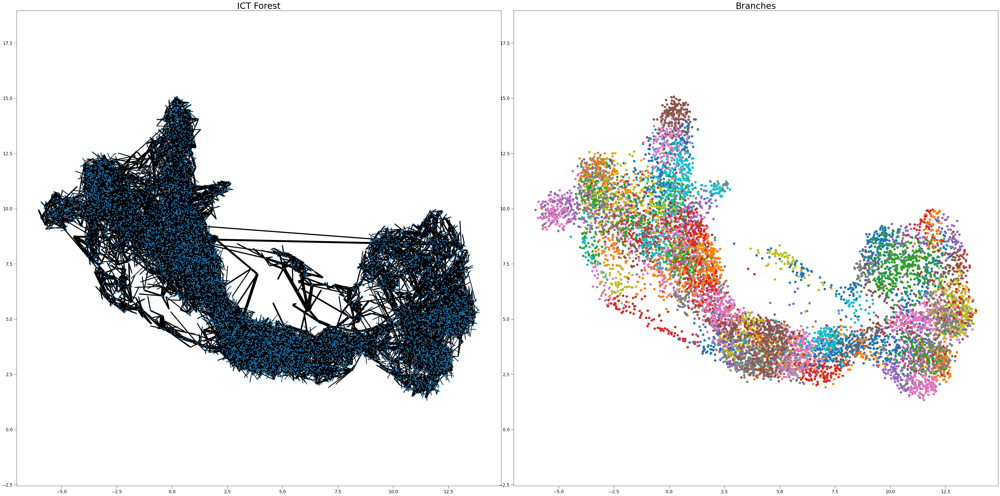

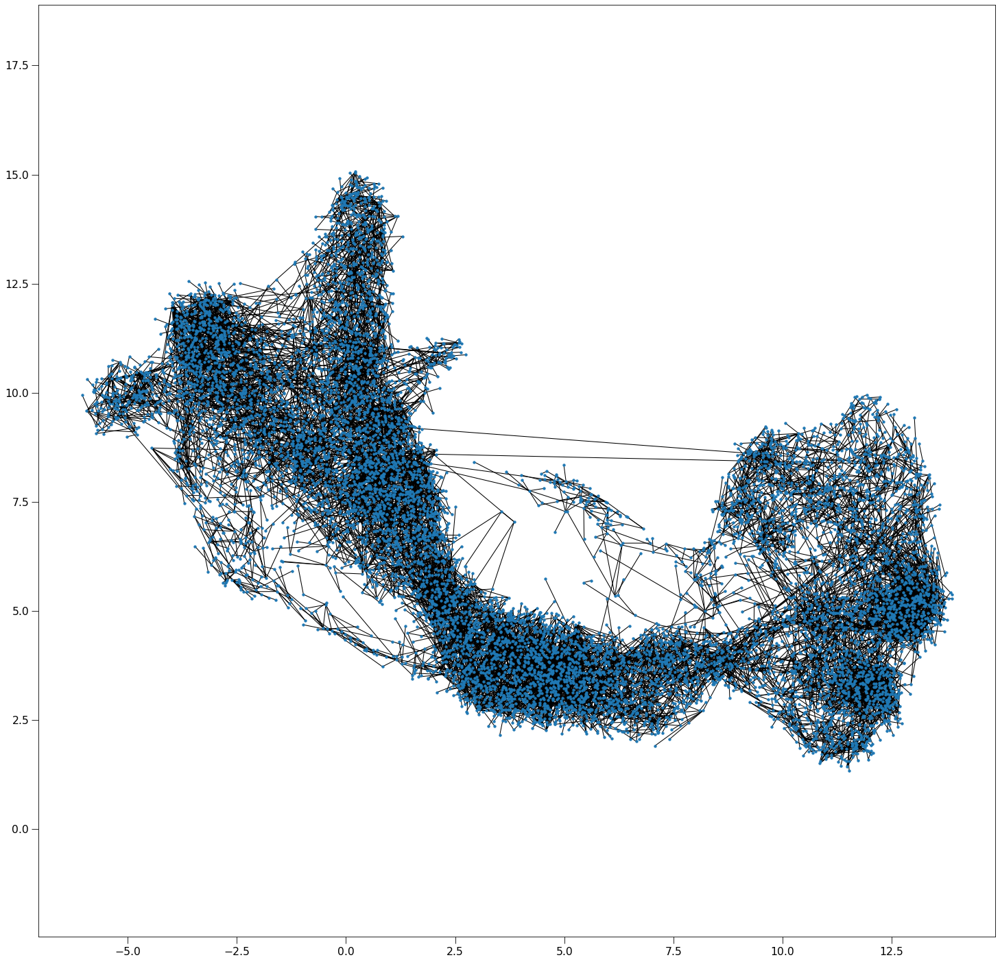

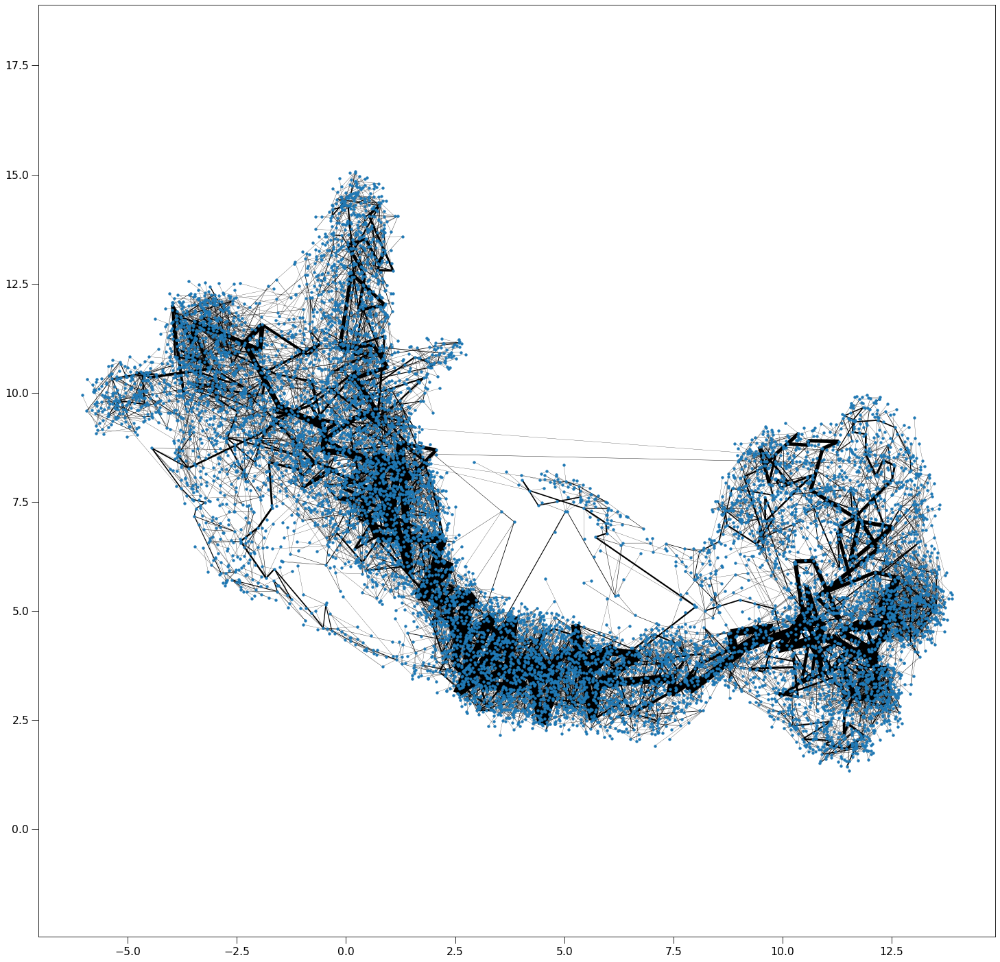

In [11]:
graphs = sub_ICTs
widths = []
for sub_ICT in sub_ICTs:
    if sub_ICT.numberOfNodes() == 1:
        widths.append([])
        continue
    widths.append(compute_widths(sub_ICT))
    
names = ["ICT Forest", "Branches"]

number_of_plots = 2
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

for i, component in enumerate(components):
    nk.viztasks.drawGraph(graphs[i], pos=embedding[component], ax=ax[0], width=widths[i], node_size=10)
            

for component in components:
    ax[1].plot(*embedding[component].T)
    
for i, name in enumerate(names):
    ax[i].set_title(name)
    ax[i].axis("equal")
    ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax[i].set_axis_on()
    
    
plt.tight_layout()
plt.show()

from sklearn.metrics import pairwise_distances

G = nk.graph.Graph(n=len(position), weighted=True)

distances = pairwise_distances(position, position)

for component, sub_ICT in zip(components, sub_ICTs):
    for u, v, w in sub_ICT.iterEdgesWeights():
        nodeA = component[u]
        nodeB = component[v]
        G.addEdge(nodeA, nodeB, distances[nodeA, nodeB])
        
# plot the not connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

G = patch_together_nearest(G, pca)
G.indexEdges()

# plot the connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, width=compute_widths(G), node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

## Cluster ICT

In [12]:
# calculate the cluster ICT with all aim nodes
start = time.time()
ICT = calculate_ICT(G, algorithm_type="cluster_all", cluster_centers=cluster_centers,
                                zeros_stay_zeros=True, update_G=1.1)
ICT.indexEdges()

create edgeId array:   0%|          | 0/10144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/10144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/10144 [00:00<?, ?it/s]

update Arr 10144 -> 10144
added 6429 edges early
added 3714 edges early


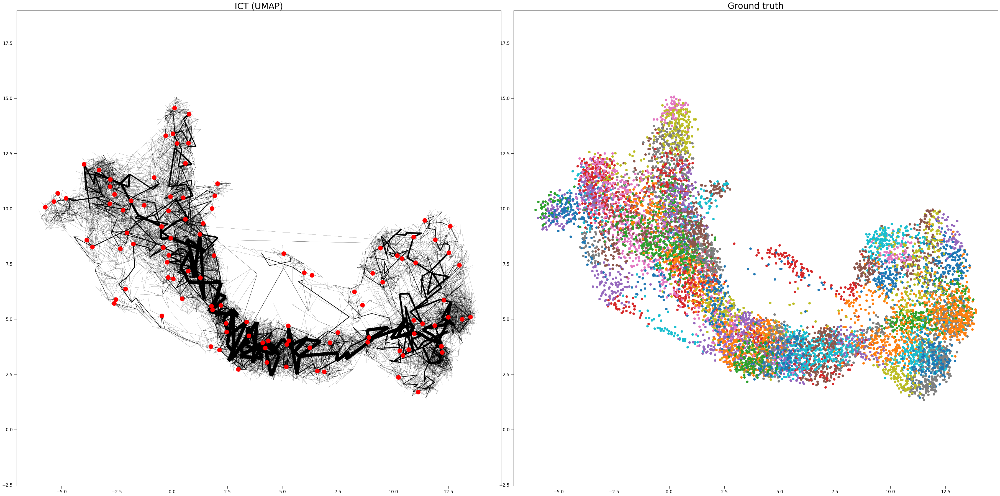

In [13]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))

plot_graph(ICT, embedding, "ICT (UMAP)", ax1, cluster_centers, node_size=0)
plot_points(embedding, "Ground truth", ax2, labels)

ax2.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-UMAP-"+parameters+".png")

plt.show()

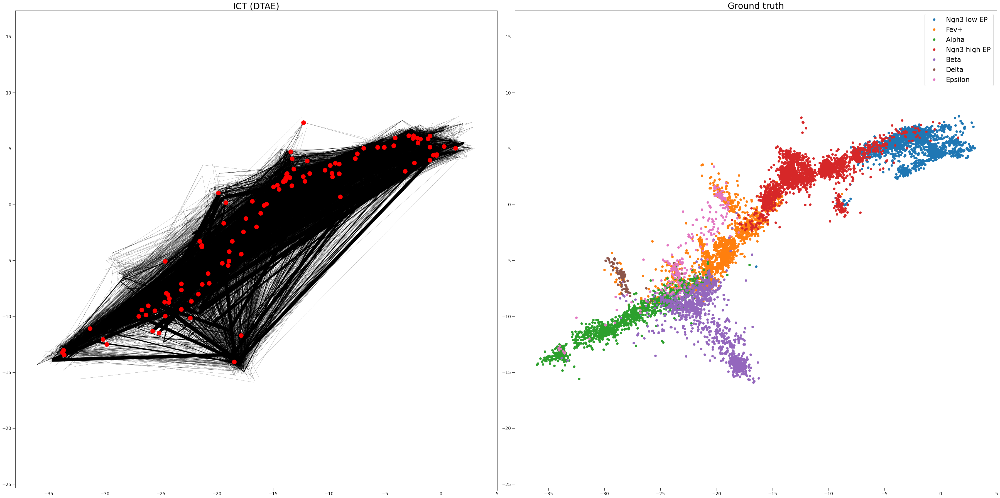

In [14]:
if (dataset == "pancreas_reduced") or (dataset == "pancreas_full") or (dataset=="eth_CC"):
    if dataset == "pancreas_reduced":
        dtae_embedding, dtae_labels = data_loader("pancreas_reduced_DTAE_embedding")
        
    elif dataset == "pancreas_full":
        dtae_embedding, dtae_labels = data_loader("pancreas_full_DTAE_embedding")
        
    elif dataset=="eth_CC":
        dtae_embedding, dtae_labels = data_loader("CC_DTAE_embedding")
    
    else:
        raise RuntimeError("Something went definitively wrong!?")
        
        
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
    plot_graph(ICT, dtae_embedding, "ICT (DTAE)", ax1, cluster_centers, node_size=0)
    plot_points(dtae_embedding, "Ground truth", ax2, dtae_labels)
    
    if dataset == "eth_CC":
        ax1.set_xlim([-50,60])
        ax2.set_xlim([-50,60])
        ax1.set_ylim([-45,50])
        ax2.set_ylim([-45,50])
    
    plt.tight_layout()
    plt.savefig("./Output/Images/"+dataset+"-DTAE-"+parameters+".png")
    plt.show()

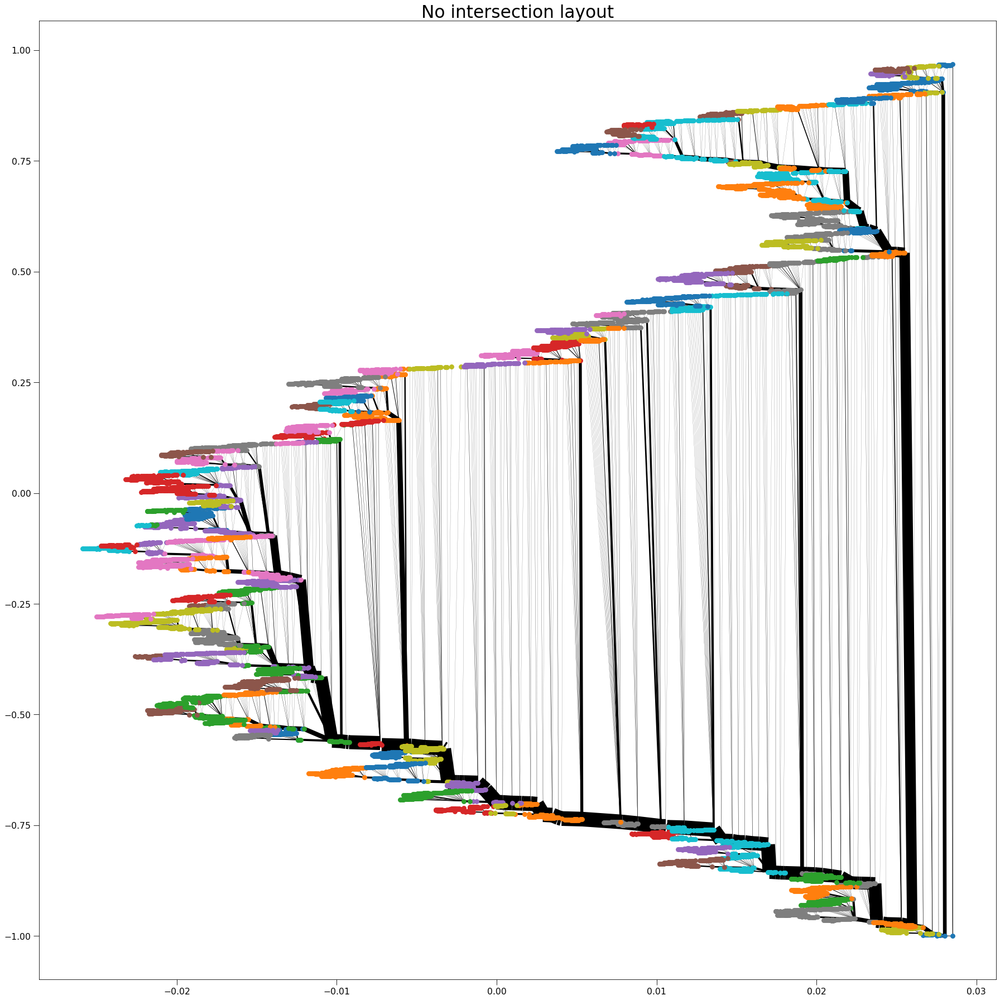

In [15]:
fig, ax = plt.subplots(1, figsize=(24,24))
no_intersections(ICT, embedding, ax, labels)
ax.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-no-intersection-"+parameters+".png")
plt.show()